# Feature analysis by number of nuclei

We load the neccesary libraries

In [92]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

We load the dataset with all the features for all the proteins and add some utilitary columns.

In [93]:
df = pd.read_csv('../data/processed/2021-03-26_features.csv', index_col=0)
df.insert(0, 'protein', df.index.str.split("_").str[0])
df.insert(1, 'plate', df.index.str.split("_").str[1])
df.insert(2, 'stimulus', df.index.str.split("_").str[2])
df

,protein,plate,stimulus,white_area_ratio,area_mean,area_std,area_median,area_mad,area_entropy,area_mode,...,texture_std_filter_mode,texture_entropy_filter_mean,texture_entropy_filter_std,texture_entropy_filter_median,texture_entropy_filter_mad,texture_entropy_filter_entropy,texture_entropy_filter_mode,global_entropy_discrete,global_entropy_kde,global_coeff_var
NegsiRNA_C3c_CA,NegsiRNA,C3c,CA,0.153746,16637.950000,11646.732082,14287.0,6981.5,14.656401,285,...,516.588501,3.294059,0.607975,3.287055,0.430039,1.327159,3.282318,4.790249,4.802271,0.475106
NegsiRNA_C3b_CA,NegsiRNA,C3b,CA,0.304616,7925.681159,5204.357864,7362.0,3644.0,13.690684,8047,...,835.012390,3.826592,0.547050,3.841366,0.387300,1.170749,3.869591,5.144402,5.154480,0.500748
NegsiRNA_E3_NO,NegsiRNA,E3,NO,0.297828,9152.662983,5861.016265,8733.0,4082.0,13.792160,324,...,696.241333,3.656484,0.564080,3.654402,0.401522,1.216988,3.590049,4.918801,4.929815,0.507799
AKT1_B2_NO,AKT1,B2,NO,0.330304,9813.732919,6168.496066,9421.0,3578.0,13.832334,630,...,1188.369629,4.154108,0.523035,4.191269,0.372221,1.086672,4.354190,5.791014,5.803408,0.540478
NegsiRNA_L2_NS,NegsiRNA,L2,NS,0.188984,16354.025641,11973.890243,14692.0,7801.0,14.286719,133,...,625.615723,3.548006,0.576589,3.554798,0.407309,1.250064,3.542132,4.889136,4.899215,0.469468
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NegsiRNA_H3_NS,NegsiRNA,H3,NS,0.287646,9603.737143,6005.232074,8918.0,3276.0,13.820058,183,...,803.342468,3.914721,0.542904,3.918922,0.389364,1.157889,4.026793,5.463957,5.476650,0.559494
NegsiRNA_E3_CA,NegsiRNA,E3,CA,0.273407,9684.988701,6795.547574,9237.0,4849.0,13.660881,158,...,652.602112,3.663541,0.588857,3.677247,0.415929,1.278160,3.870739,4.984301,4.994752,0.500610
CTNNA1_A3_NO,CTNNA1,A3,NO,0.153547,11816.662722,15246.811242,8115.0,7508.0,12.918557,178,...,525.445984,3.328485,0.597775,3.338016,0.426792,1.301539,3.273900,4.569930,4.580187,0.455083
NUMB_E3_CA,NUMB,E3,CA,0.271097,8729.426396,5398.034067,8229.0,3936.0,13.871534,1946,...,576.452637,3.543888,0.565170,3.543282,0.403005,1.220069,3.634047,4.776272,4.785130,0.453597


The normalization must be done using the NegsiRNA samples with no stimuli as reference, so we filter the data in order to work with just that samples.

In [94]:
df_negsi_ns = df[(df['protein'] == 'NegsiRNA') & (df['stimulus'] == 'NS')] 
df_negsi_ns

,protein,plate,stimulus,white_area_ratio,area_mean,area_std,area_median,area_mad,area_entropy,area_mode,...,texture_std_filter_mode,texture_entropy_filter_mean,texture_entropy_filter_std,texture_entropy_filter_median,texture_entropy_filter_mad,texture_entropy_filter_entropy,texture_entropy_filter_mode,global_entropy_discrete,global_entropy_kde,global_coeff_var
NegsiRNA_L2_NS,NegsiRNA,L2,NS,0.188984,16354.025641,11973.890243,14692.0,7801.0,14.286719,133,...,625.615723,3.548006,0.576589,3.554798,0.407309,1.250064,3.542132,4.889136,4.899215,0.469468
NegsiRNA_G3_NS,NegsiRNA,G3,NS,0.239506,12123.135135,6724.839819,11964.0,4811.0,14.120058,25070,...,718.552246,3.727769,0.585909,3.736361,0.411526,1.272247,3.773858,5.055952,5.069138,0.544023
NegsiRNA_F3_NS,NegsiRNA,F3,NS,0.281612,12648.402985,8348.251731,12314.5,5483.0,14.213718,4,...,722.297607,3.767866,0.610388,3.771776,0.442338,1.323828,3.700548,5.271409,5.285017,0.549777
NegsiRNA_D1_NS,NegsiRNA,D1,NS,0.250790,8580.611650,6151.951701,7528.5,4195.0,13.757380,4,...,545.209656,3.337365,0.603501,3.332474,0.424929,1.316325,3.198723,4.685021,4.695801,0.484134
NegsiRNA_G1_NS,NegsiRNA,G1,NS,0.330879,6605.234310,3941.027072,6294.0,3071.0,13.391345,5024,...,625.229614,3.641625,0.555086,3.626953,0.403233,1.187092,3.619654,5.020604,5.029001,0.455166
NegsiRNA_C2_NS,NegsiRNA,C2,NS,0.307114,8603.752632,6699.223730,7642.5,4340.0,13.586796,299,...,662.526245,3.540871,0.559543,3.527349,0.392757,1.203993,3.552567,4.857666,4.869074,0.493571
NegsiRNA_F2_NS,NegsiRNA,F2,NS,0.306993,12201.522388,7913.931587,11633.5,6091.0,13.923187,16108,...,773.727905,3.818430,0.575995,3.829004,0.418175,1.241040,4.036623,5.236222,5.247883,0.517509
NegsiRNA_A2_NS,NegsiRNA,A2,NS,0.225510,11074.236364,7234.436975,10136.0,4622.0,14.074884,5514,...,830.302002,3.853664,0.544865,3.856772,0.385118,1.167518,3.929126,5.330096,5.342982,0.529134
NegsiRNA_A2b_NS,NegsiRNA,A2b,NS,0.241458,10652.517857,6125.591787,10230.0,3775.5,14.063475,69,...,952.687744,3.920384,0.549168,3.920960,0.384791,1.177964,3.855077,5.515296,5.530317,0.584109
NegsiRNA_E3_NS,NegsiRNA,E3,NS,0.211370,11009.532544,7945.905466,10004.0,5388.0,14.060565,82,...,627.693970,3.643499,0.581148,3.649028,0.411083,1.261344,3.641267,4.910865,4.925221,0.510195


For each feature in the dataset, we plot the feature value against the number of nuclei in the corresponding NegsiRNA NS image (they're a lot of features)

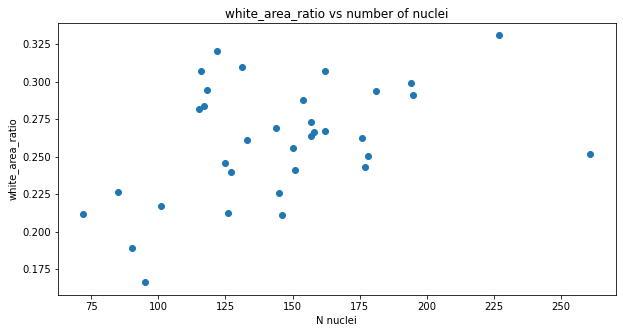

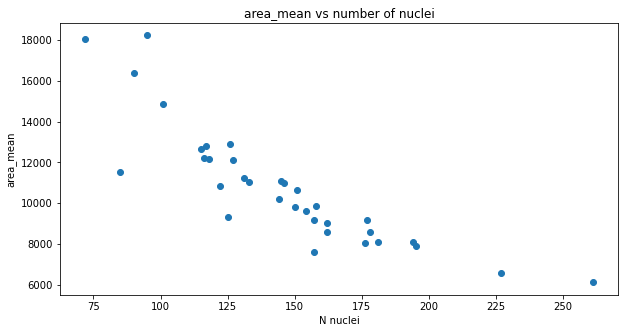

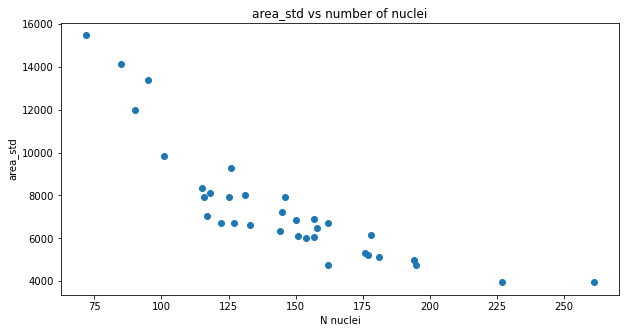

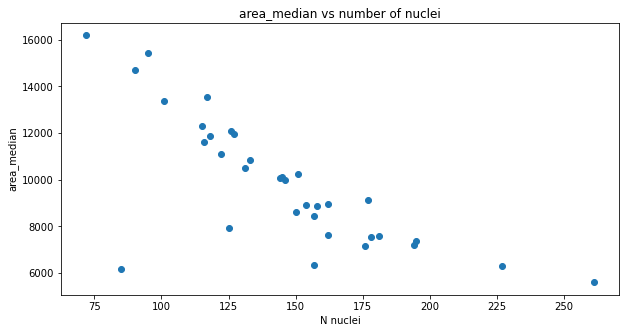

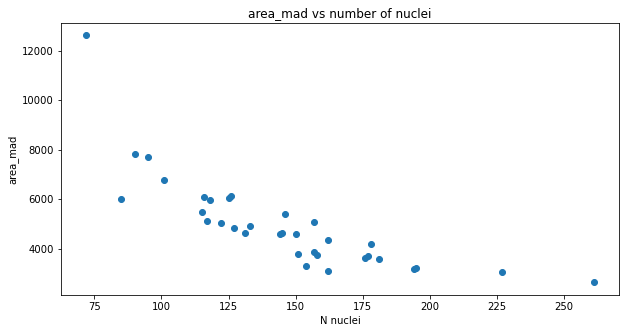

...

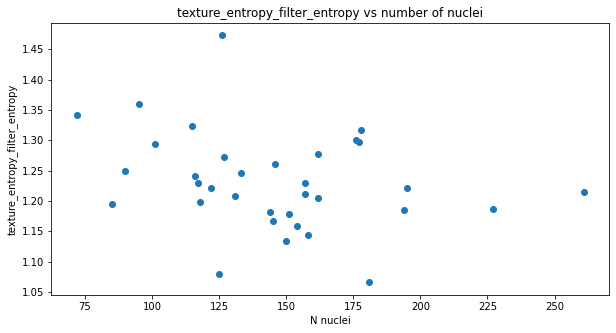

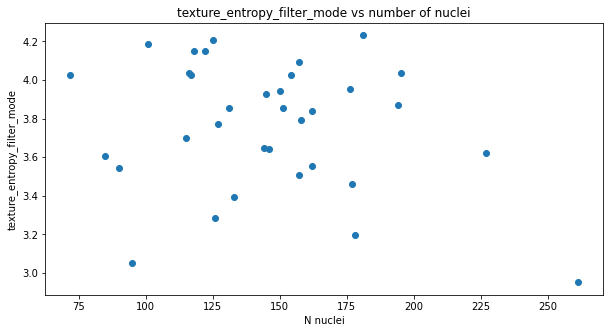

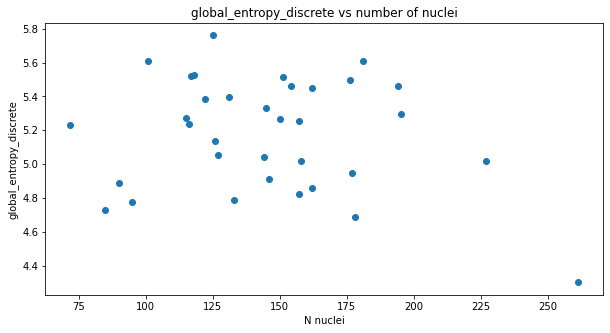

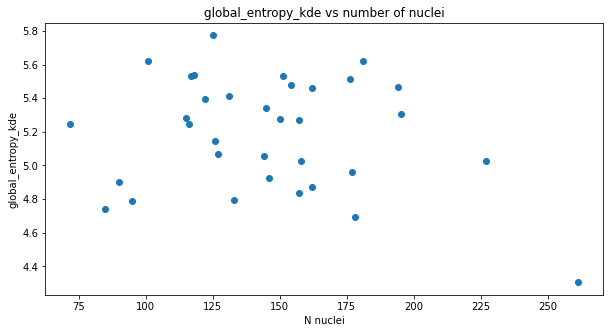

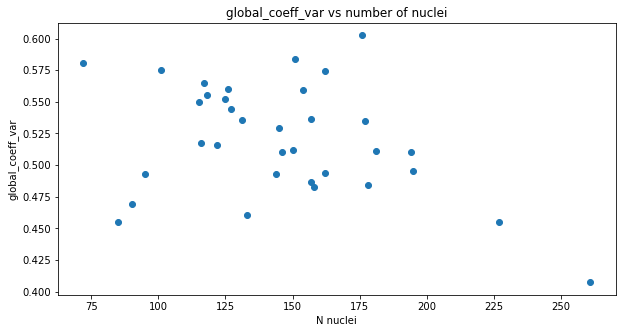

In [96]:
data = df_negsi_ns.iloc[:, 3:].sort_values(by='nuclei_n').drop(columns='nuclei_n')
x = np.array(df_negsi_ns['nuclei_n'].sort_values())
for column in data.columns:
    y = data[column]
    plt.figure(figsize=(10, 5))
    plt.scatter(x, y)
    plt.title(f'{column} vs number of nuclei')
    plt.ylabel(column)
    plt.xlabel('N nuclei')
    plt.show()
    plt.close()